### DATA SCIENCE PROJECT ON CUSTOMER TRANSACTION PREDICTION

### BUSINESS CASE :
__BASED ON GIVEN FEATURE OF DATASET WE NEED TO PREDICT WHICH CUSTOMER MAKE TRANSACTION IN THE FEATURE IRRESPTIVE OF THE AMOUNT OF MONEY TRANSACTED__

### IMPORTING THE LIBRARIES

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns 
import warnings 
warnings.filterwarnings('ignore')

### LOAD DATA 

In [2]:
data = pd.read_csv('train.csv')
data.head(10)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
5,train_5,0,11.4763,-2.3182,12.6080,8.6264,10.9621,3.5609,4.5322,15.2255,...,-6.3068,6.6025,5.2912,0.4403,14.9452,1.0314,-3.6241,9.7670,12.5809,-4.7602
6,train_6,0,11.8091,-0.0832,9.3494,4.2916,11.1355,-8.0198,6.1961,12.0771,...,8.7830,6.4521,3.5325,0.1777,18.3314,0.5845,9.1104,9.1143,10.8869,-3.2097
7,train_7,0,13.5580,-7.9881,13.8776,7.5985,8.6543,0.8310,5.6890,22.3262,...,13.1700,6.5491,3.9906,5.8061,23.1407,-0.3776,4.2178,9.4237,8.6624,3.4806
8,train_8,0,16.1071,2.4426,13.9307,5.6327,8.8014,6.1630,4.4514,10.1854,...,1.4298,14.7510,1.6395,1.4181,14.8370,-1.9940,-1.0733,8.1975,19.5114,4.8453
9,train_9,0,12.5088,1.9743,8.8960,5.4508,13.6043,-16.2859,6.0637,16.8410,...,0.5543,6.3160,1.0371,3.6885,14.8344,0.4467,14.1287,7.9133,16.2375,14.2514


### DOMAIN ANALYSIS
### INTRODUCTION
The problem is identifying the customers who will make a transaction with the bank in future, irrespective of the amount of money transacted previously with the bank, the dataset contain 200000 observation with 202 columns and 200 columns having values from  var_1 to var_200, one column for ID code and one column for target.

### TARGET COLUMN == TARGET [0,1]
__(0)Represents -- CUSTOMER DID NOT MAKE A TRANSACTION.__

__(1)Represents -- CUSTOMER WILL MAKE THE TRANSACTION.__

### BASIC CHECKS

In [3]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [4]:
data.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001
199999,train_199999,0,10.8762,-5.7105,12.1183,8.0328,11.5577,0.3488,5.2839,15.2058,...,8.9842,1.6893,0.1276,0.3766,15.2101,-2.4907,-2.2342,8.1857,12.1284,0.1385


In [5]:
data.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [6]:
data.shape

(200000, 202)

In [7]:
data.dtypes

ID_code     object
target       int64
var_0      float64
var_1      float64
var_2      float64
            ...   
var_195    float64
var_196    float64
var_197    float64
var_198    float64
var_199    float64
Length: 202, dtype: object

#### EXAMINE THE DATA 

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


### STATISTICAL MEASURE OF THE DATA

In [9]:
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


No Constant Column is Present in Data

### EXPLORATORY DATA ANALYSIS

__Checking the target balance__

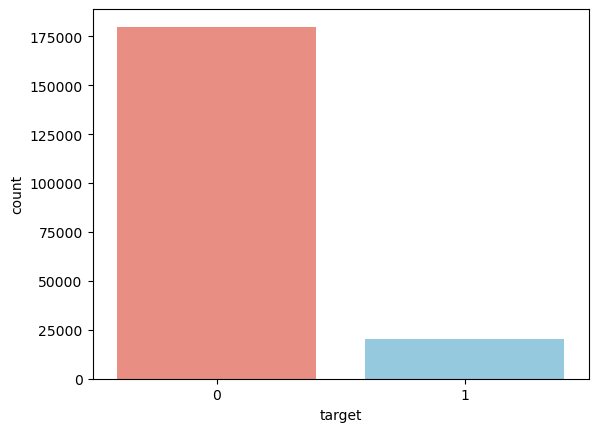

In [10]:
sns.countplot(x='target', data=data,palette=['salmon', 'skyblue'])
plt.show()

In [11]:
data.target.value_counts()

target
0    179902
1     20098
Name: count, dtype: int64

1. In this plot we are clearly seen the 90% customer are did not do a transaction and 10% customer are did do the transaction.
2. This target feature is imbalance so we need to balance the data with the help of oversampling.

__IMPORTANT NOTE :__

IN THIS DATA WE NOT GOING TO DO ANY DOMAIN ANALYSIS BECAUSE OF WE DONT HAVE ANY FEATURE NAME AND THE DATA CONTAIN PRIVATE INFORMATION OF CUSTOMER DETAILS OF BANK TRANSACTION.

__Checking the Distribution of the first 100 feature__

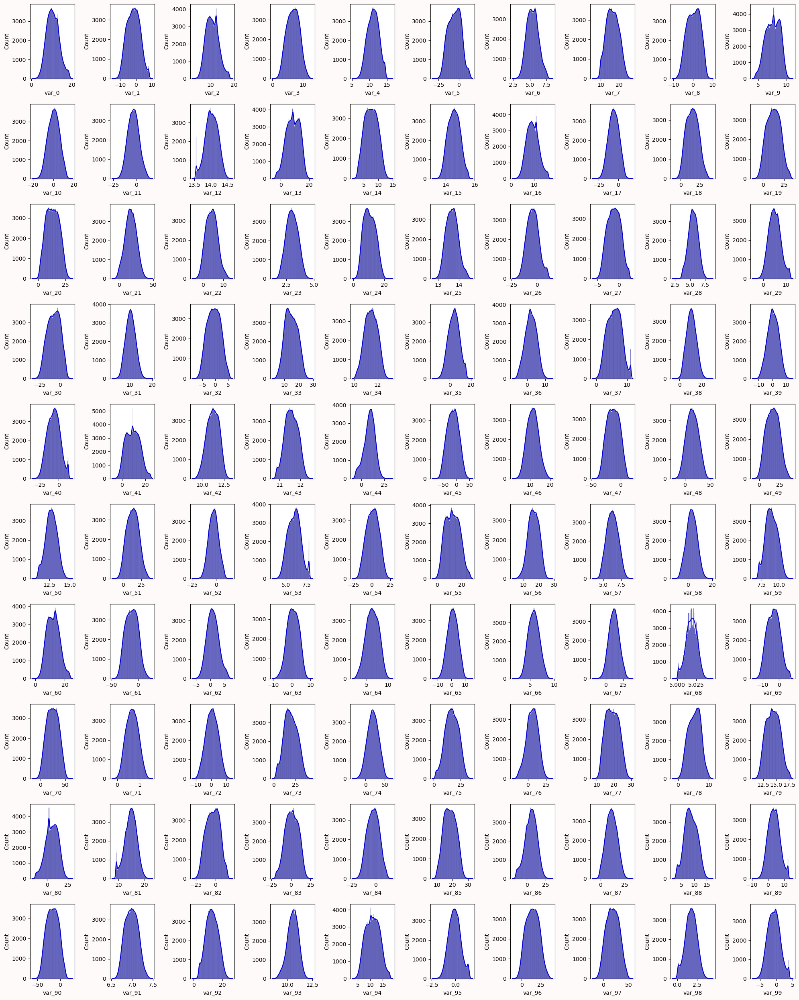

In [12]:
dist=data.iloc[:,2:102]
plt.figure(figsize=(20,25),facecolor='snow')
plotnum=1
for column in dist:
    plt.subplot(10,10,plotnum)
    if plotnum<=100:
        sns.histplot(dist[column],kde=True,color='mediumblue')
    plotnum+=1
plt.tight_layout()
plt.show()

__Checking Distribution For Second 100 Features__

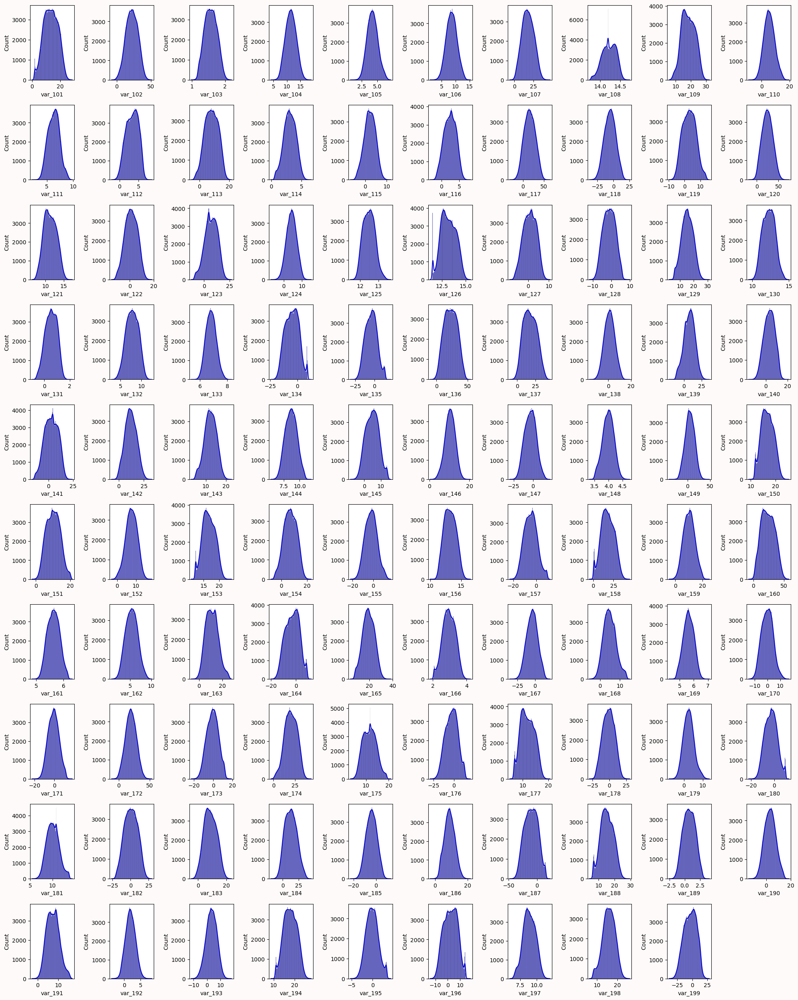

In [13]:
dist=data.iloc[:,103:]
plt.figure(figsize=(20,25),facecolor='snow')
plotnum=1
for column in dist:
    plt.subplot(10,10,plotnum)
    if plotnum<=100:
        sns.histplot(dist[column],kde=True,color='mediumblue')
    plotnum+=1
plt.tight_layout()
plt.show()

### OBSERVATION:
From the above two plots, we can clearly see that most of the features follow a normal distribution, and some features are very close to it. Therefore, we do not need to use any feature transformation techniques because our features are already mostly normal.

### Statistical Analysis 

__Distribution Mean Of The Data__

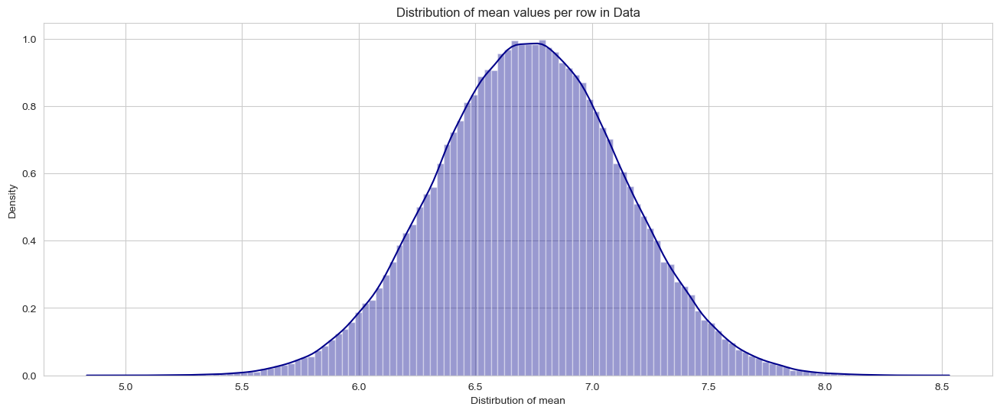

In [14]:
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
plt.title('Distribution of mean values per row in Data')
features=data.columns.values[1:202]
plt.xlabel('Distirbution of mean')
sns.distplot(data[features].mean(axis=1),color='darkblue',kde=True,bins=120)
plt.show()

__Observation__

From above graph we can say that around 80% feature mean lies between 6.5 to 7.0

__Distribution Standard Deviation of the Data__

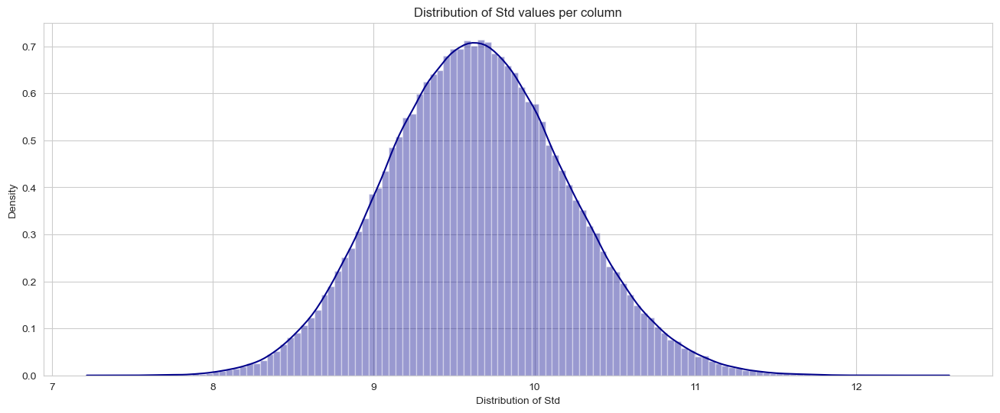

In [15]:
features=data.columns.values[1:202]
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
plt.title('Distribution of Std values per column')
plt.xlabel('Distribution of Std')
sns.distplot(data[features].std(axis=1),kde=True,color='darkblue',bins=120)
plt.show()

__Observation:__

This graph also look like guassian distribution around 60% of feature standard deviation around the range of 9 to 10

### Data Preprocessing

In [16]:
data.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

In [17]:
if data.isnull().sum().sum() == 0:
    print("No missing values found in the dataset.")
else:
    print("Missing values is present.")


No missing values found in the dataset.


### Outlier Handling

From the above EDA we seen the feature are very close to the normal distribution as well as distance between point is very less 
so we are not impute the outlier we are use scaling to robust the outlier

###  FEATURE SCALING

1. Here we are use robust scaling because the data set contain the outlier but feature is follow a normal distribution.
2. robust scaler is similar to normalization but it insted uses the interquatile range, so that is robust to outlier.

In [18]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7','var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199',]] = scaler.fit_transform(data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7',
      'var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199']])

       


In [19]:
# Checking the data after Scaling

In [20]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,train_1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,train_2,0,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436
3,train_3,0,0.124444,-0.089159,-0.429020,0.120748,0.620850,0.247176,0.370517,-0.296912,...,0.195359,-0.598020,-0.574591,-0.351340,1.065039,-0.548868,-0.627542,1.047370,0.480670,-0.385163
4,train_4,0,-0.159803,0.020439,0.604761,-0.061074,0.491579,0.600549,0.449607,0.541684,...,-0.726076,0.499102,-0.996298,1.031426,-0.979782,-0.669600,0.178488,0.458709,0.487211,-0.373372


scaled successfully

### FEATURE SELECTION

__1. droping unique and constant column__

here we are going to drop ID_code

In [21]:
data.drop('ID_code',axis=1,inplace=True)

In [22]:
data.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,0,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,-1.010902,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436
3,0,0.124444,-0.089159,-0.429020,0.120748,0.620850,0.247176,0.370517,-0.296912,-1.190060,...,0.195359,-0.598020,-0.574591,-0.351340,1.065039,-0.548868,-0.627542,1.047370,0.480670,-0.385163
4,0,-0.159803,0.020439,0.604761,-0.061074,0.491579,0.600549,0.449607,0.541684,1.117206,...,-0.726076,0.499102,-0.996298,1.031426,-0.979782,-0.669600,0.178488,0.458709,0.487211,-0.373372


__2. Checking for correlation__

In [23]:
data.corr()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,0.066731,-0.003025,0.019584,...,0.055973,0.047114,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,0.006983,0.002429,0.004962,...,0.002752,0.000206,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,0.050343,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,0.003258,0.001511,0.004098,...,0.006627,0.003621,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.055870,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,0.000883,-0.000991,0.002648,...,0.000197,0.001285,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.011055,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-0.000774,0.002500,0.003553,...,0.000151,0.002445,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
var_195,0.028285,0.002073,-0.000785,-0.001070,0.001206,0.003706,-0.001274,0.001244,0.001854,0.001396,...,0.004571,0.000870,-0.004745,-0.003143,-0.001201,1.000000,0.002517,-0.004170,-0.000536,0.002042
var_196,0.023608,0.004386,-0.000377,0.003952,-0.002800,0.000513,0.002880,0.005378,0.001045,-0.003242,...,-0.000847,0.002466,-0.001386,-0.005308,-0.005040,0.002517,1.000000,-0.000454,0.000253,0.000607
var_197,-0.035303,-0.000753,-0.004157,0.001078,0.001164,-0.000046,-0.000535,-0.003565,0.003466,-0.004583,...,-0.004974,0.000906,-0.000527,0.005068,0.000884,-0.004170,-0.000454,1.000000,0.001183,0.004991
var_198,-0.053000,-0.005776,-0.004861,-0.000877,-0.001651,-0.001821,-0.000953,-0.003025,0.000650,0.002950,...,-0.000153,-0.000067,0.003451,0.001646,0.003194,-0.000536,0.000253,0.001183,1.000000,-0.004731


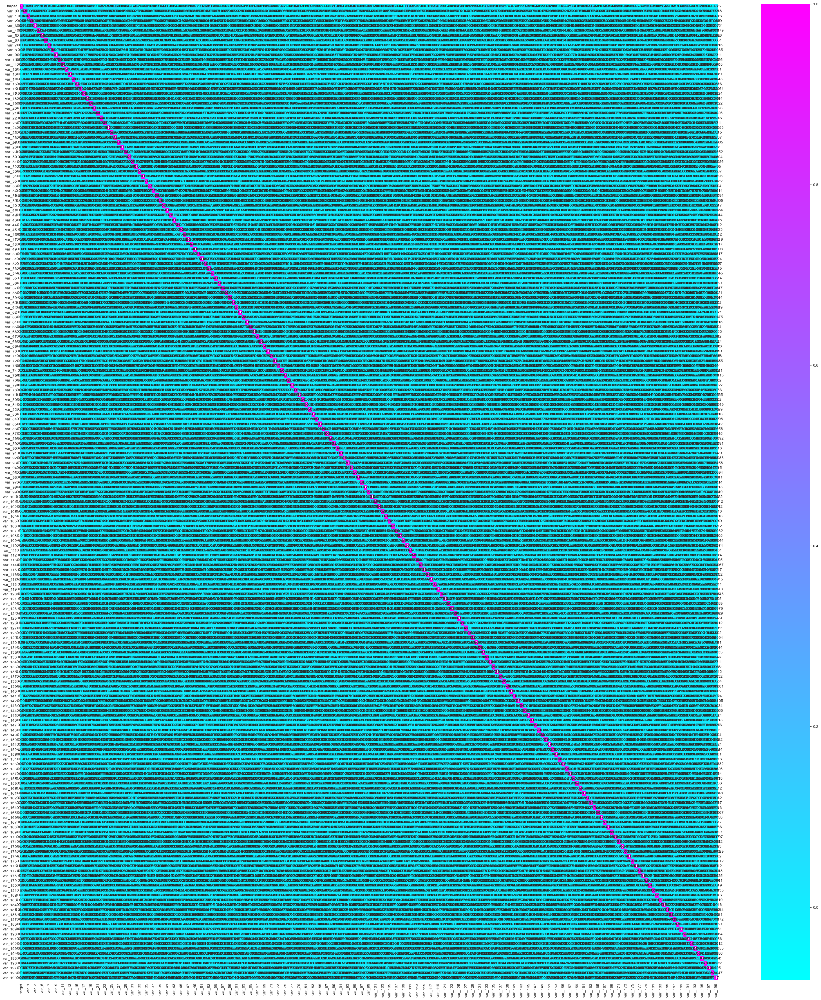

In [24]:
plt.figure(figsize=(40,45))
sns.heatmap(data.corr(),annot=True,cmap='cool')
plt.show()

1. From above heatmap scale we are clearly seen the their is no highly correlated feature in data
2. But we confirm with the help of python code

In [25]:
corr = data.corr().abs()
high_corr = corr[(corr > 0.9) & (corr < 1.0)]

if high_corr.dropna(how='all').dropna(axis=1, how='all').empty:
    print("No highly correlated features")
else:
    print(high_corr.dropna(how='all').dropna(axis=1, how='all'))


No highly correlated features


__So there is no Highly corelated features in the data__

__Checking for Duplicates__

In [26]:
data.duplicated().sum()

0

### PCA-Principal component analysis

In [27]:
data.head(3)

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,0,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,-1.010902,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436


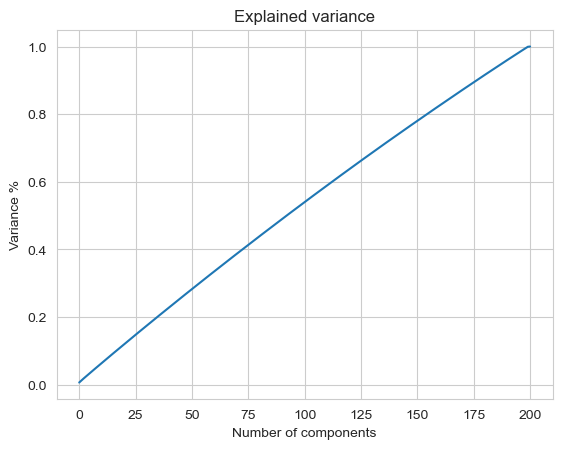

In [28]:
from sklearn.decomposition import PCA

pca = PCA()
principal_component = pca.fit_transform(data)

plt.figure()
sns.set_style('whitegrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Variance %')
plt.title('Explained variance')
plt.show()

In [29]:
# Selecting the components
pca = PCA(n_components=175)
new_data = pca.fit_transform(data)
new_data

array([[ 0.51758867,  0.26955976,  0.05402251, ..., -0.91197506,
         0.02825685, -0.01823824],
       [-1.32400732, -0.53357927,  1.95817087, ..., -0.11897006,
        -0.04993349, -0.091531  ],
       [ 0.04224386, -0.81522866, -0.3257926 , ..., -0.04433698,
        -1.15220835, -0.52020052],
       ...,
       [-0.01423866,  0.55522966,  0.65142503, ..., -0.13624811,
        -0.40374922,  0.61777042],
       [ 0.40689894,  0.23820526,  0.38221209, ...,  0.55847262,
         0.11239184, -0.75789081],
       [ 0.76575485, -0.16503883,  0.39951196, ..., -1.09182605,
        -0.47622989,  0.67725346]])

In [30]:
# Create a new dataframe
principle_data = pd.DataFrame(data=new_data,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10',
                            'pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22',
                            'pca23','pca24','pca25','pca26','pca27','pca28','pca29','pca30','pca31','pca32','pca33','pca34',
                            'pca35','pca36','pca37','pca38','pca39','pca40','pca41','pca42','pca43','pca44','pca45','pca46',
                            'pca47','pca48','pca49','pca50','pca51','pca52','pca53','pca54','pca55','pca56','pca57','pca58',
                            'pca59','pca60','pca61','pca62','pca63','pca64','pca65','pca66','pca67','pca68','pca69','pca70',
                            'pca71','pca72','pca73','pca74','pca75','pca76','pca77','pca78','pca79','pca80','pca81','pca82',
                            'pca83','pca84','pca85','pca86','pca87','pca88','pca89','pca90','pca91','pca92','pca93','pca94',
                            'pca95','pca96','pca97','pca98','pca99','pca100','pca101','pca102','pca103','pca104','pca105',
                            'pca106','pca107','pca108','pca109','pca110','pca111','pca112','pca113','pca114','pca115','pca116',
                            'pca117','pca118','pca119','pca120','pca121','pca122','pca123','pca124','pca125','pca126','pca127',
                            'pca128','pca129','pca130','pca131','pca132','pca133','pca134','pca135','pca136','pca137','pca138',
                            'pca139','pca140','pca141','pca142','pca143','pca144','pca145','pca146','pca147','pca148','pca149',
                            'pca150','pca151','pca152','pca153','pca154','pca155','pca156','pca157','pca158','pca159','pca160',
                            'pca161','pca162','pca163','pca164','pca165','pca166','pca167','pca168','pca169','pca170',
                            'pca171','pca172','pca173','pca174','pca175'])
principle_data.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,0.517589,0.269560,0.054023,-0.369893,0.835381,0.662795,1.319730,1.064223,-0.849499,0.433281,...,-0.554410,-0.611039,1.112001,-0.258308,-0.751815,0.967646,-0.750007,-0.911975,0.028257,-0.018238
1,-1.324007,-0.533579,1.958171,1.308587,0.328150,0.049564,-1.179654,0.139923,0.443926,0.601061,...,-0.807269,0.357139,-1.262798,-0.132334,0.126031,0.782291,0.295756,-0.118970,-0.049933,-0.091531
2,0.042244,-0.815229,-0.325793,0.225673,-0.013017,0.143188,0.106796,-0.226355,-0.768914,0.082743,...,0.571805,0.691044,0.271241,-0.335684,-0.558622,0.601425,-0.833146,-0.044337,-1.152208,-0.520201
3,-1.384955,0.367701,0.459503,-0.644095,0.384638,-0.117310,-1.266890,0.159772,0.618706,0.584172,...,1.503312,0.682461,-0.035037,0.304494,-0.194574,-0.874634,-0.182145,0.717708,0.512492,0.430749
4,-0.592824,-0.160891,0.584662,-0.840627,-0.147873,0.404153,0.678792,-0.868974,-0.354538,-0.451727,...,-0.459845,-0.455293,-0.147366,1.475875,0.264492,0.164119,-0.102101,0.239766,-0.584007,-0.161014


### Model Creation

#### AIM

1. In customer transaction prediction f1 score metrix is important so we need more focus to improve f1 score 
2. Create a sweet spot model (Low bias, Low variance)

#### X and Y

In [31]:
X = principle_data
Y = data.target

In [32]:
X.head(2)

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,0.517589,0.269560,0.054023,-0.369893,0.835381,0.662795,1.319730,1.064223,-0.849499,0.433281,...,-0.554410,-0.611039,1.112001,-0.258308,-0.751815,0.967646,-0.750007,-0.911975,0.028257,-0.018238
1,-1.324007,-0.533579,1.958171,1.308587,0.328150,0.049564,-1.179654,0.139923,0.443926,0.601061,...,-0.807269,0.357139,-1.262798,-0.132334,0.126031,0.782291,0.295756,-0.118970,-0.049933,-0.091531


In [33]:
Y.head(3)

0    0
1    0
2    0
Name: target, dtype: int64

#### USING SMOTE TO BALANCE THE TARGET COLUMN.

In [34]:
from collections import Counter
from imblearn.over_sampling import SMOTE

sm=SMOTE()
print('unbalanced data =',Counter(Y))
X_sm,Y_sm = sm.fit_resample(X,Y)
print('Balanced data =',Counter(Y_sm))

unbalanced data = Counter({0: 179902, 1: 20098})
Balanced data = Counter({0: 179902, 1: 179902})


#### SPLITTING DATA FOR TRAIN AND TEST.

In [35]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X_sm,Y_sm,random_state=42,test_size=0.30)
# iam giving 30 % to testing because large data

In [36]:
X_train.shape

(251862, 175)

In [37]:
y_train.shape

(251862,)

In [38]:
X_test.shape

(107942, 175)

In [39]:
y_test.shape

(107942,)

### MODELS

### LOGISTIC-REGRESSION

In [40]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression()

log_reg.fit(X_train,y_train)

LogisticRegression()

In [41]:
log_train_predict =log_reg.predict(X_train)
log_test_Ypredict =log_reg.predict(X_test)

__Evaluation__

__Training Score__

In [42]:
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,classification_report,confusion_matrix
log_train_acc= accuracy_score(log_train_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_acc*100)
print('LOGISTIC REGRESSION TRAINING REPORT\n',classification_report(log_train_predict,y_train))

Training accuracy of Logistic regression model 83.68908370456838
LOGISTIC REGRESSION TRAINING REPORT
               precision    recall  f1-score   support

           0       0.83      0.84      0.84    123789
           1       0.85      0.83      0.84    128073

    accuracy                           0.84    251862
   macro avg       0.84      0.84      0.84    251862
weighted avg       0.84      0.84      0.84    251862



__Testing Score__

In [111]:
log_bag_acc = accuracy_score(log_test_Ypredict,y_test)
print("Testing accuracy of Logistic regession",log_bag_acc*100)
print('TESTING REPORT FOR LOGISTIC REGRESSION :')
logisticregression_model = classification_report(y_test,log_test_Ypredict, output_dict=True)
print(classification_report(y_test,log_test_Ypredict))

Testing accuracy of Logistic regession 83.6245391043338
TESTING REPORT FOR LOGISTIC REGRESSION :
              precision    recall  f1-score   support

           0       0.84      0.83      0.84     53998
           1       0.83      0.84      0.84     53944

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



__Logistic Regression Insight__

The Logistic Regression model gives about 83% accuracy with balanced performance across both classes. It captures basic customer patterns but struggles with more complex behavior. While it performs reasonably well, it doesn’t provide the level of accuracy needed.

In [44]:
from sklearn.metrics import roc_curve,auc
false_positive_rate,true_positive_rate,thresholds=roc_curve(y_test,log_test_Ypredict)
roc_auc_score=auc(false_positive_rate,true_positive_rate)
print(roc_auc_score)

0.8362489835928417


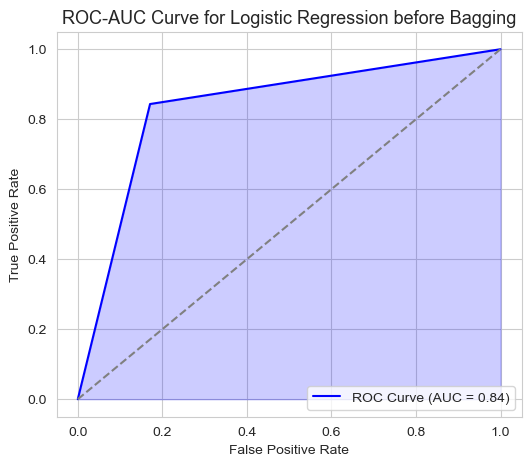

In [45]:
plt.figure(figsize=(6,5))
plt.plot(false_positive_rate, true_positive_rate,color='blue', label=f"ROC Curve (AUC = {roc_auc_score:.2f})")
plt.fill_between(false_positive_rate, true_positive_rate,alpha=0.2, color='blue')  # fills AUC area
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.title("ROC-AUC Curve for Logistic Regression before Bagging", fontsize=13)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

Here in Logistic Regression scores are poor so lets do Bagging and see.

__Bagging for LogisticRegression__

In [46]:
log_reg1 = LogisticRegression()

from sklearn.ensemble import BaggingClassifier
bagg = BaggingClassifier(estimator=log_reg1,n_estimators=50)
bagg.fit(X_train,y_train)

BaggingClassifier(estimator=LogisticRegression(), n_estimators=50)

In [47]:
bagg_predict = bagg.predict(X_test)

__Testing Score__

In [48]:
log_bag_acc = accuracy_score(bagg_predict,y_test)
print("Testing accuracy of Logistic regession model after bagging",log_bag_acc*100)
print('LOGISTIC REGRESSION BAGGING TESTING REPORT :')
logisticregression_Bagg = classification_report(y_test, bagg_predict, output_dict=True)
print(classification_report(y_test,bagg_predict))

Testing accuracy of Logistic regession model after bagging 83.62083341053528
LOGISTIC REGRESSION BAGGING TESTING REPORT :
              precision    recall  f1-score   support

           0       0.84      0.83      0.84     53998
           1       0.83      0.84      0.84     53944

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



In [49]:
bag_f1_score = f1_score(bagg_predict,y_test)
bag_f1_score*100

83.73385345747617

In [50]:
from sklearn.metrics import roc_curve,auc
false_positive_rate,true_positive_rate,thresholds=roc_curve(y_test,bagg_predict)
roc_auc_score=auc(false_positive_rate,true_positive_rate)
print(roc_auc_score)

0.8362120193377296


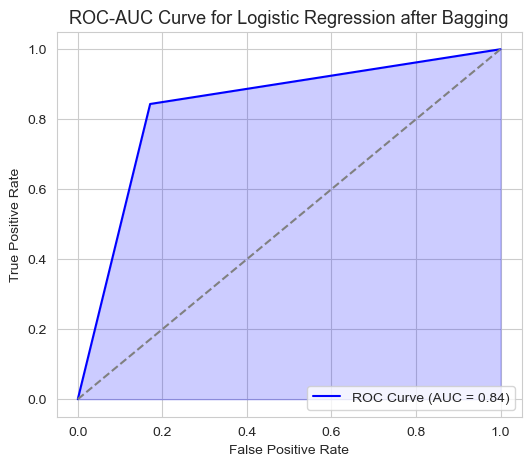

In [51]:
# graph for roc and auc curves 
plt.figure(figsize=(6,5))
plt.plot(false_positive_rate, true_positive_rate,color='blue', label=f"ROC Curve (AUC = {roc_auc_score:.2f})")
plt.fill_between(false_positive_rate, true_positive_rate,alpha=0.2, color='blue')  # fills AUC area
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.title("ROC-AUC Curve for Logistic Regression after Bagging", fontsize=13)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

__After applying Bagging score are not improving So lets move to next Model__

### XGB-CLASSIFIER 

In [77]:
import xgboost
from xgboost import XGBClassifier

xgb = XGBClassifier()

xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [78]:
XGB_train_predict =xgb.predict(X_train)
XGB_test_Ypredict =xgb.predict(X_test)

### Evaluation

__Training score__

In [79]:
XGB_train_acc= accuracy_score(XGB_train_predict,y_train)
print("Training accuracy for XGB model",XGB_train_acc*100)
print('XGB MODEL TRAINING REPORT\n',classification_report(XGB_train_predict,y_train))

Training accuracy for XGB model 93.76801581818614
XGB MODEL TRAINING REPORT
               precision    recall  f1-score   support

           0       0.93      0.94      0.94    124932
           1       0.94      0.93      0.94    126930

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



__Testing score__

In [80]:
XGB_test_acc= accuracy_score(XGB_test_Ypredict,y_test)
print('Testing accuracy for XGB model',XGB_test_acc*100)
print('XGB MODEL TEST REPORT\n',classification_report(XGB_test_Ypredict,y_test))

Testing accuracy for XGB model 90.66628374497415
XGB MODEL TEST REPORT
               precision    recall  f1-score   support

           0       0.90      0.91      0.91     53199
           1       0.91      0.90      0.91     54743

    accuracy                           0.91    107942
   macro avg       0.91      0.91      0.91    107942
weighted avg       0.91      0.91      0.91    107942



In [81]:
xgb_f1_score = f1_score(XGB_test_Ypredict,y_test)
print('F1 SCORE FOR XGB IS:',xgb_f1_score*100)

F1 SCORE FOR XGB IS: 90.73026212886546


In [82]:
from sklearn.metrics import roc_curve,auc
false_positive_rate,true_positive_rate,thresholds=roc_curve(y_test,XGB_test_Ypredict)
roc_auc_score=auc(false_positive_rate,true_positive_rate)
print(roc_auc_score)

0.9066665171416454


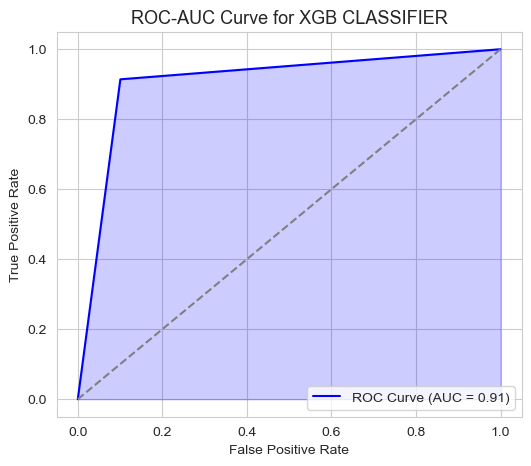

In [83]:
# graph for roc and auc curves 
plt.figure(figsize=(6,5))
plt.plot(false_positive_rate, true_positive_rate,color='blue', label=f"ROC Curve (AUC = {roc_auc_score:.2f})")
plt.fill_between(false_positive_rate, true_positive_rate,alpha=0.2, color='blue')  # fills AUC area
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.title("ROC-AUC Curve for XGB CLASSIFIER", fontsize=13)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

__Insight for XGB Classifier__

The XGBoost model is already doing a great job, giving about 90% accuracy with strong and balanced results for both classes. It understands customer behavior much better than simpler models and makes reliable predictions. Even without tuning.

__Cross validation for XGB Classifier__

In [84]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

pipe = Pipeline([
    ('scaler', RobustScaler()),
    ('xgb', XGBClassifier(
        random_state=42,
        eval_metric='logloss'
    ))
])

cv_scores = cross_val_score(
    pipe,
    X_train,
    y_train,
    cv=5,
    scoring='f1' 
)

print("Cross-validation F1 scores:", cv_scores)
print("Mean F1 score:", cv_scores.mean())
print("Standard deviation:", cv_scores.std())

Cross-validation F1 scores: [0.9046606  0.9048912  0.90460365 0.90427731 0.90400867]
Mean F1 score: 0.9044882833651574
Standard deviation: 0.00030980119076955414


__Cross Validation Insight__

XGBoost is performing really well in cross-validation, giving F1-scores around 0.90 in every fold. The scores hardly change, which means the model is very stable and handles the data consistently. Even without tuning, it’s already a strong and trustworthy model.

### Hyper Parameter tuning for XGB CLASSIFIER

In [61]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

xgb_model = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=10,     
    scoring='f1',
    cv=3,
    n_jobs=1,        
    verbose=0,
    random_state=42
)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)
best_xgb = random_search.best_estimator_

Best Parameters: {'subsample': 1.0, 'n_estimators': 400, 'max_depth': 5, 'learning_rate': 0.1, 'colsample_bytree': 0.8}


__Hyper Parameter Tuning values in XGB Classifier__

In [85]:
# hyperparameters values in XGB
afterhp_xgb = XGBClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=400,
    subsample=1.0,
    colsample_bytree=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

afterhp_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=400,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [86]:
XGB_train_predict1 =afterhp_xgb.predict(X_train)
XGB_test_Ypredict1 =afterhp_xgb.predict(X_test)

In [87]:
XGB_train_acc= accuracy_score(XGB_train_predict1,y_train)
print("Training accuracy for XGB model",XGB_train_acc*100)
print('XGB MODEL TRAINING REPORT\n',classification_report(XGB_train_predict1,y_train))

Training accuracy for XGB model 93.03070729208852
XGB MODEL TRAINING REPORT
               precision    recall  f1-score   support

           0       0.93      0.93      0.93    125421
           1       0.93      0.93      0.93    126441

    accuracy                           0.93    251862
   macro avg       0.93      0.93      0.93    251862
weighted avg       0.93      0.93      0.93    251862



In [88]:
XGB_test_acc= accuracy_score(XGB_test_Ypredict1,y_test)
print('Testing accuracy for XGB model',XGB_test_acc*100)
print('XGB MODEL TEST REPORT\n',classification_report(XGB_test_Ypredict1,y_test))

Testing accuracy for XGB model 90.6588723573771
XGB MODEL TEST REPORT
               precision    recall  f1-score   support

           0       0.90      0.91      0.91     53497
           1       0.91      0.90      0.91     54445

    accuracy                           0.91    107942
   macro avg       0.91      0.91      0.91    107942
weighted avg       0.91      0.91      0.91    107942



In [66]:
tuned_xgb_f1_score = f1_score(XGB_test_Ypredict1,y_test)
print('Tuned XGB F1 score :',tuned_xgb_f1_score)

Tuned XGB F1 score : 0.9069739549216249


In [112]:
from sklearn.metrics import roc_curve,auc
false_positive_rate,true_positive_rate,thresholds=roc_curve(y_test,XGB_test_Ypredict1)
roc_auc_score=auc(false_positive_rate,true_positive_rate)
print(roc_auc_score)

0.9065910221341323


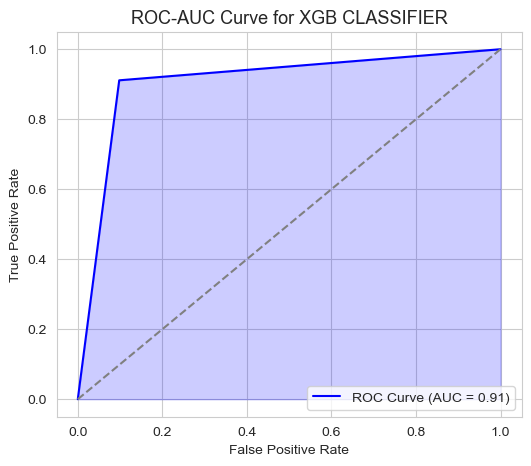

In [113]:
# graph for roc and auc curves 
plt.figure(figsize=(6,5))
plt.plot(false_positive_rate, true_positive_rate,color='blue', label=f"ROC Curve (AUC = {roc_auc_score:.2f})")
plt.fill_between(false_positive_rate, true_positive_rate,alpha=0.2, color='blue')  # fills AUC area
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.title("ROC-AUC Curve for Tuned XGB CLASSIFIER", fontsize=13)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

__Insight for XGB Classifier__

After hyperparameter tuning, the XGBoost model delivers even stronger performance, achieving around 91% accuracy with balanced precision, recall, and F1-scores for both classes. The model now captures customer behavior more accurately and makes more reliable predictions. Overall, tuning clearly improved the model a bit.

__Cross Validation for Tuned XGB Classifier__

In [67]:
pipe = Pipeline([
    ('scaler', RobustScaler()),
    ('xgb', XGBClassifier(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=400,
    subsample=1.0,
    colsample_bytree=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
))
])

cv_scores = cross_val_score(
    pipe,
    X_train,
    y_train,
    cv=5,
    scoring='f1' 
)

print("Cross-validation F1 scores:", cv_scores)
print("Mean F1 score:", cv_scores.mean())
print("Standard deviation:", cv_scores.std())

Cross-validation F1 scores: [0.90577951 0.90536832 0.9049688  0.90590464 0.90359854]
Mean F1 score: 0.9051239625598907
Standard deviation: 0.000830651026706849


__Cross Validation Insight for Tuned XGB__

The tuned XGBoost model shows F1-scores that are very close to the untuned version, with only tiny differences across folds. this means tuning did not significantly boost the model’s performance because the baseline XGBoost was already highly optimized. Overall, the model remains stable and reliable, but tuning didn’t add much improvement

### ANN MLP CLASSIFIER

In [68]:
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=100,
                      random_state=42)

model.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(60, 3), max_iter=100, random_state=42)

In [69]:
ANN_train_pre = model.predict(X_train)
ANN_test_pre = model.predict(X_test)

### Evaluation

__Training score__

In [70]:
ann_train_acc= accuracy_score(ANN_train_pre,y_train)
print('Training accuracy for ANN mlp classifier model :',ann_train_acc)
print('CLASSIFICATION TRAINING REPORT FOR ANN MLP CLASSIFIER\n',classification_report(ANN_train_pre,y_train))

Training accuracy for ANN mlp classifier model : 0.9362905082942247
CLASSIFICATION TRAINING REPORT FOR ANN MLP CLASSIFIER
               precision    recall  f1-score   support

           0       0.94      0.94      0.94    125678
           1       0.94      0.94      0.94    126184

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



__Testing_score__

In [89]:
ann_test_acc = accuracy_score(ANN_test_pre,y_test)
print('Testing accuracy for ANN mlp classifier model :',ann_test_acc)
print('CLASSIFIACTION TESTING REPORT FOR ANN MLP CLASSIFIER\n',classification_report(ANN_test_pre,y_test))

Testing accuracy for ANN mlp classifier model : 0.9027625947267978
ERROR! Session/line number was not unique in database. History logging moved to new session 224
CLASSIFIACTION TESTING REPORT FOR ANN MLP CLASSIFIER
               precision    recall  f1-score   support

           0       0.90      0.91      0.90     53166
           1       0.91      0.90      0.90     54776

    accuracy                           0.90    107942
   macro avg       0.90      0.90      0.90    107942
weighted avg       0.90      0.90      0.90    107942



In [72]:
ANN_f1_score = f1_score(ANN_test_pre,y_test)
print("F1 SCORE FOR ANN IS:",ANN_f1_score*100)

F1 SCORE FOR ANN IS: 90.345842531273


In [73]:
from sklearn.metrics import roc_curve,auc
false_positive_rate,true_positive_rate,thresholds=roc_curve(y_test,ANN_test_pre)
roc_auc_score=auc(false_positive_rate,true_positive_rate)
print(roc_auc_score)

0.9027664263846356


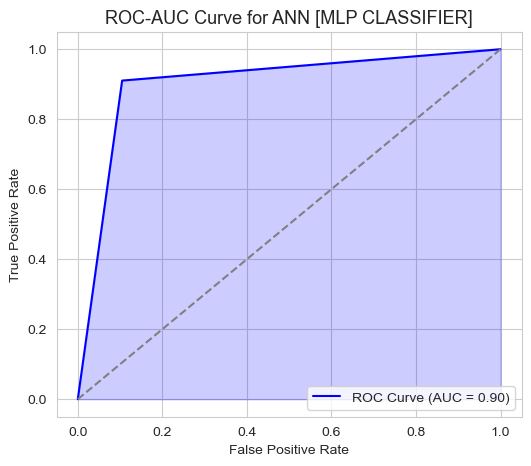

In [74]:
# graph for roc and auc curves 
plt.figure(figsize=(6,5))
plt.plot(false_positive_rate, true_positive_rate,color='blue', label=f"ROC Curve (AUC = {roc_auc_score:.2f})")
plt.fill_between(false_positive_rate, true_positive_rate,alpha=0.2, color='blue')  # fills AUC area
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.title("ROC-AUC Curve for ANN [MLP CLASSIFIER]", fontsize=13)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

__Insight for ANN MLP Classifier__

The ANN model performs very well even before tuning, achieving around 90% accuracy with balanced F1-scores for both transaction and non-transaction classes. It clearly picks up complex customer patterns better than simpler models. Overall, the untuned ANN already gives strong and reliable predictions for Production.

__Cross Validation Insight for ANN MLP Classifier__

In [109]:
pipe = Pipeline([
    ('scaler', RobustScaler()),
    ('ann', MLPClassifier(
        hidden_layer_sizes=(60, 30),
        learning_rate='constant',
        max_iter=100,
        random_state=42
    ))
])
cv_scores = cross_val_score(
    pipe,
    X_train,
    y_train,
    cv=5,
    scoring='f1'
)

print("Cross-validation F1 scores:", cv_scores)
print("Mean F1 score:", cv_scores.mean())
print("Standard deviation:", cv_scores.std())

Cross-validation F1 scores: [0.9048341  0.90848727 0.90463354 0.90320952 0.90254271]
Mean F1 score: 0.9047414265058917
Standard deviation: 0.002060712214142906


__Cross Validation Insight for ANN MLP Classifier__

The ANN model performs strongly in cross-validation, with F1-scores consistently around 0.90 across all folds. The low standard deviation shows the model is stable and gives similar results on different parts of the data. Overall, it generalizes well and captures customer patterns reliably even before tuning.

### Hyper Parameter Tuning for ANN MLP CLASSIFIER

In [90]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'hidden_layer_sizes': [
        (50,), (80,), (100,),     
    ],
    'activation': ['relu'],       
    'solver': ['adam'],           
    'learning_rate': ['constant'],
    'alpha': [0.0001, 0.001],      
    'batch_size': [64],            
    'max_iter': [150, 200]         
}

mlp = MLPClassifier(
    random_state=42,
    early_stopping=True,   
    warm_start=True        
)

# ---- Randomized Search ----
random_search = RandomizedSearchCV(
    estimator=mlp,
    param_distributions=param_dist,
    n_iter=5,              
    scoring='f1',
    cv=5,
    n_jobs=1,              
    random_state=42,
    verbose=0
)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)
best_mlp = random_search.best_estimator_


Best Parameters: {'solver': 'adam', 'max_iter': 150, 'learning_rate': 'constant', 'hidden_layer_sizes': (100,), 'batch_size': 64, 'alpha': 0.001, 'activation': 'relu'}


__Hyper Parameter Values in ANN MLP CLASSIFIER__

In [91]:
#Hyper parameter values in ann mlp classifier
ann_mlp = MLPClassifier(hidden_layer_sizes=(100,),
                      learning_rate='constant',
                      max_iter=150,
                      solver='adam',
                      batch_size=64,
                      alpha=0.001,
                      activation='relu',
                      random_state=42)

ann_mlp.fit(X_train,y_train)

MLPClassifier(alpha=0.001, batch_size=64, max_iter=150, random_state=42)

In [92]:
anntrainpred=ann_mlp.predict(X_train)
annypred=ann_mlp.predict(X_test)

__Training Score__

In [96]:
acc=accuracy_score(y_train,anntrainpred)
print('ACCURACY SCORE FOR TUNED ANN MLP CLASSIFIER',acc)
print('CLASSIFICATION TRAINING REPORT FOR TUNED ANN MLP CLASSIFIER \n',classification_report(y_train,anntrainpred))

ACCURACY SCORE FOR TUNED ANN MLP CLASSIFIER 0.9607046716058794
CLASSIFICATION TRAINING REPORT FOR TUNED ANN MLP CLASSIFIER 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96    125904
           1       0.96      0.96      0.96    125958

    accuracy                           0.96    251862
   macro avg       0.96      0.96      0.96    251862
weighted avg       0.96      0.96      0.96    251862



__Testing Score__

In [97]:
accp=accuracy_score(y_test,annypred)
print('ACCURACY SCORE FOR TUNED ANN MLP CLASSIFIER',accp)
print('CLASSIFICATION TESTING REPORT FOR TUNED ANN MLP CLASSIFIER \n',classification_report(y_test,annypred))

ACCURACY SCORE FOR TUNED ANN MLP CLASSIFIER 0.9156954660836375
CLASSIFICATION TESTING REPORT FOR TUNED ANN MLP CLASSIFIER 
               precision    recall  f1-score   support

           0       0.93      0.90      0.91     53998
           1       0.90      0.93      0.92     53944

    accuracy                           0.92    107942
   macro avg       0.92      0.92      0.92    107942
weighted avg       0.92      0.92      0.92    107942



In [99]:
ANN_f1_Tscore = f1_score(annypred,y_test)
print("F1 SCORE FOR ANN IS:",ANN_f1_Tscore*100)

F1 SCORE FOR ANN IS: 91.67688001902428


In [115]:
from sklearn.metrics import roc_curve,auc
false_positive_rate,true_positive_rate,thresholds=roc_curve(y_test,annypred)
roc_auc_score=auc(false_positive_rate,true_positive_rate)
print(roc_auc_score)

0.9157021466270903


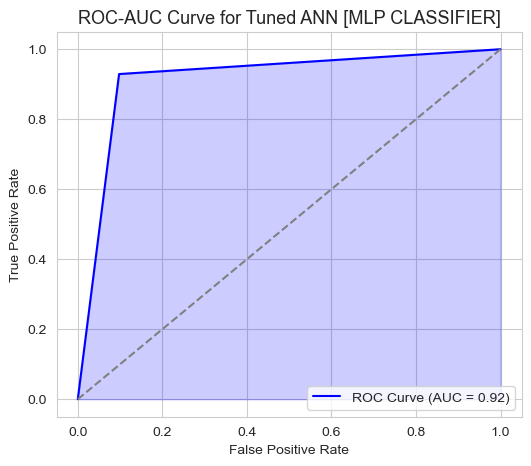

In [116]:
# graph for roc and auc curves 
plt.figure(figsize=(6,5))
plt.plot(false_positive_rate, true_positive_rate,color='blue', label=f"ROC Curve (AUC = {roc_auc_score:.2f})")
plt.fill_between(false_positive_rate, true_positive_rate,alpha=0.2, color='blue')  # fills AUC area
plt.plot([0,1], [0,1], linestyle='--', color='gray')
plt.title("ROC-AUC Curve for Tuned ANN [MLP CLASSIFIER]", fontsize=13)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

__Insight for Tuned ANN MLP Classifier__

After tuning, the ANN model shows noticeable improvement, reaching about 92% accuracy with strong and balanced F1-scores for both classes. It now captures customer behavior more effectively and makes more accurate predictions than the untuned version. Overall, the tuned ANN provides a solid boost in performance and reliability for Production.

In [110]:
pipe = Pipeline([
    ('scaler', RobustScaler()),
    ('ann', MLPClassifier(
       hidden_layer_sizes=(100,),
                      learning_rate='constant',
                      max_iter=150,
                      solver='adam',
                      batch_size=64,
                      alpha=0.001,
                      activation='relu',
                      random_state=42
    ))
])
cv_scores = cross_val_score(
    pipe,
    X_train,
    y_train,
    cv=5,
    scoring='f1'
)

print("Cross-validation F1 scores:", cv_scores)
print("Mean F1 score:", cv_scores.mean())
print("Standard deviation:", cv_scores.std())

Cross-validation F1 scores: [0.90989149 0.9099064  0.91178123 0.906663   0.9076332 ]
Mean F1 score: 0.9091750627091162
Standard deviation: 0.0018181309978411364


__Cross Validation Insight for ANN MLP Classifier__

The tuned ANN model shows strong and consistent cross-validation results, with F1-scores around 0.90 across all folds. The very low standard deviation indicates stable performance. Overall, it’s a reliable and well-performing model after tuning.

### NOTE:

1. I attempted hyperparameter tuning for both __XGBoost__ and __ANN MLP CLASSIFIER__ models using __RandomizedSearchCV__ and __GridSearchCV__.
2. However, due to the large dataset     size, GridSearchCV took an extremely long time to run, even on Google Colab. Because of this.
3. I was only able to complete tuning with RandomizedSearchCV, as it is much faster and more efficient for large datasets.
4. Therefore, I selected RandomizedSearchCV for this project since GridSearchCV was too slow and not practical to use.

### REPORT:

1. From the above step in Data preprocessing i didnt remove outliers because data contains huge features so that i've __skipped__ outlier handling instead of that i did __Robust Scaling__.
2. I use __RobustScaler__ because it scales data using __median__ and __IQR__,which makes it less affected by extreme values.
3. This helps keep the data balanced without letting outliers distort the model.
4. I skipped seperate outlier removal since RobustScaler already reduces their impact,and removing them could have caused the loss of useful __information__. 

### MODEL SELECTION FOR PRODUCTION:

1. After evaluating all the models, the Tuned __ANN [MLP Classifier]__ emerged as the best choice for production.
2. The ANN achieved an impressive testing accuracy of around 92%, with balanced precision, recall, and F1-scores for both transaction and non-            transaction classes.
3. Its ROC–AUC score of 0.92 shows excellent class separation, indicating strong predictive ability.
4. The cross-validation results were consistently close to 0.90, with very low standard deviation, which confirms that the model is stable and            performs reliably across different parts of the dataset.
5. Although the tuned XGBoost model also performed well with approximately 91% accuracy and strong metrics, its performance was slightly lower than       the ANN in both testing results and cross-validation consistency.
6. __XG BOOST__ came very close, but the ANN model demonstrated smoother learning, better generalization, and higher robustness on large-scale numeric    data. Considering the overall accuracy, AUC, and stability, the __ANN (MLP Classifier)__ provides the strongest and most dependable performance,       making it the preferred model for production.